# Battle of The Titans
## Stock Market Anlalysis for Tech Giants

In this project we will be looking at data from the stock market, particularly the stocks of Apple, Google, Microsoft, and Amazon. We will use pandas to get stock information, visualize different aspects of it, and finally we will look at a few ways of analyzing the risk of a stock, based on its previous performance history. We will also be predicting future stock prices through a Monte Carlo method!

We'll be answering the following questions along the way:

1. What was the change in price of the stock over time?

2. What was the daily return of the stock on average?

3. What was the moving average of the various stocks?

4. What was the correlation between different stocks' closing prices?

5. What was the correlation between different stocks' daily returns?

6. How much value do we put at risk by investing in a particular stock?

7. How can we attempt to predict future stock behavior?

## The Change in Price of The Stock Over Time

In this section we'll go over how to handle requesting stock information with pandas, and how to analyze basic attributes of a stock.

In [4]:
#Let's go ahead and start with some imports
import pandas as pd
from pandas import Series,DataFrame
import numpy as np
import statsmodels


# For Visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# plotly imports
# plotly.plotly contains all the machinery to communicate with Plotly
import plotly.plotly as py
import plotly.figure_factory as ff

# plotly.graph_objs contains all the helper classes to make/style plots
import plotly.graph_objs as go

# to work with plotly offline
import plotly
plotly.offline.init_notebook_mode()

# import cufflings to easily plot pandas data frames
import cufflinks as cf
# work with cufflinks offline
cf.go_offline()

# For reading stock data from yahoo
from pandas_datareader.data import DataReader

# For time stamps
from datetime import datetime

# import sys 
import sys

In [5]:
# for reproducibility purposes, here are the versions of modules I used in this article
print("statsmodels: {}".format(statsmodels.__version__))
print("numpy: {}".format(np.__version__))
print("pandas: {}".format(pd.__version__))
print("matplotlib: {}".format(matplotlib.__version__))
print("seaborn: {}".format(sns.__version__))
print("plotly: {}".format(plotly.__version__))
print("cufflinks: {}".format(cf.__version__))
print("python: {}".format(sys.version))

statsmodels: 0.8.0
numpy: 1.12.1
pandas: 0.19.2
matplotlib: 1.5.1
seaborn: 0.7.1
plotly: 2.0.6
cufflinks: 0.8.2
python: 3.5.2 |Anaconda custom (64-bit)| (default, Jul  5 2016, 11:41:13) [MSC v.1900 64 bit (AMD64)]


Let's use Yahoo and pandas to grab some data for some tech stocks.

In [6]:
# The tech stocks we'll use for this analysis
tech_list = ['AAPL','GOOG','MSFT','AMZN']

# Set up End and Start times for data grab
end = datetime.now()
# we want the start date to be a year a go
start = datetime(end.year - 1,end.month,end.day)



#For loop for grabing yahoo finance data and setting as a dataframe

for stock in tech_list:   
    # Set DataFrame names as the Stock Tickers
    # "AAPL" -> AAPL (and you can call it from the global environment)
    globals()[stock] = DataReader(stock,'yahoo',start,end)
    
    # DataReader reads dates as time-stamps
    # Converting timestamp to date 
    globals()[stock]["Date"] = globals()[stock].index.date
    globals()[stock].set_index("Date", drop=True, inplace=True)

Quick note: Using globals() is a sloppy way of setting the DataFrame names, but its simple.

Let's go ahead and play aorund with the AAPL DataFrame to get a feel for the data

In [7]:
# Summary Stats
plotly.offline.iplot(ff.create_table(AAPL.describe().round(2), index = True))

In [8]:
# General Info
AAPL.info()

<class 'pandas.core.frame.DataFrame'>
Index: 253 entries, 2016-03-30 to 2017-03-29
Data columns (total 6 columns):
Open         253 non-null float64
High         253 non-null float64
Low          253 non-null float64
Close        253 non-null float64
Volume       253 non-null int64
Adj Close    253 non-null float64
dtypes: float64(5), int64(1)
memory usage: 13.8+ KB


In [9]:
aapl_close = go.Figure()
aapl_close['data'].append(go.Scatter(x = AAPL.index,
                              y = AAPL['Adj Close'],
                              opacity = 0.75,
                              marker = dict(line = dict(color = 'blue', width = 0.9))))

aapl_close['layout'].update(title = 'AAPL Closing Price')
plotly.offline.iplot(aapl_close)

In [10]:
# Now let's plot the total volume of stock being traded each day over the past 5 years
aapl_volume = go.Figure()

aapl_volume['data'].append(go.Scatter(x = AAPL.index, y = AAPL['Volume']))

aapl_volume['layout'].update(title = "AAPL Stock Trade Volume")

plotly.offline.iplot(aapl_volume)

Now that we've seen the visualizations for the closing price and the volume traded each day, let's go ahead and caculate the moving average for the stock.

For more info on the moving average check out the following links:

1. http://www.investopedia.com/terms/m/movingaverage.asp
2. http://www.investopedia.com/articles/active-trading/052014/how-use-moving-average-buy-stocks.asp

In [11]:
# Luckily pandas has a built-in rolling mean calculator

# Let's go ahead and plot out several moving averages
ma_day = [10,20,50]

for ma in ma_day:
    column_name = "{}days MA".format(str(ma))
    AAPL[column_name]= AAPL['Adj Close'].rolling(ma).mean()

In [12]:
#Let's look at the AAPL data frame now
plotly.offline.iplot(ff.create_table(AAPL.head(20).round(2), index = True, index_title="Date"))

Now let's go ahead and plot all the additional Moving Averages

In [13]:
# first, store the columns to be plotted in a list
cols = ['Adj Close', '10days MA', '20days MA', '50days MA']

Now, there are 2 ways to plot overlayed line plot:

In [14]:
# 1st method, using normal plotly procedure
plotly.offline.iplot([go.Scatter(x = AAPL.index, y = AAPL[col], name = col) for col in cols])

In [15]:
# 2nd method: using cufflinks, which is much easier
AAPL[cols].iplot(kind = 'scatter')

Notice how the moving average curve gets smoother as we increase its window.

## The Average Daily Return Analysis

Now that we've done some baseline analysis, let's go ahead and dive a little deeper. We're now going to analyze the risk of the stock. In order to do so we'll need to take a closer look at the daily changes of the stock, and not just its absolute value. Let's go ahead and use pandas to retrieve the daily returns for the Apple stock.

In [16]:
# We'll use pct_change to find the percent change for each day
AAPL['Daily Return'] = AAPL['Adj Close'].pct_change()
# Then we'll plot the daily return percentage
AAPL['Daily Return'].iplot(kind = "scatter", mode = 'lines+markers', size = 4)

Great, now let's get an overall look at the distribution of average daily return:

In [17]:
fig, ax = plt.subplots()

ax.set_title("AAPL Daily Return Distribution")

sns.distplot(AAPL['Daily Return'].dropna(), color = 'purple', hist_kws=dict(alpha = 0.7))

plotly.offline.iplot_mpl(fig, resize = True)

In [18]:
# repeating the same previous plot using cufflinks (without the overlayed density plot)
AAPL['Daily Return'].iplot(kind = 'histogram', barmode = 'overlay', color = "blue", line_color = "darkblue", bins = 30)

#using normal plotly syntax
#aapl_hist = go.Figure()
#aapl_hist['data'].append(go.Histogram(ax = AAPL['Daily Return'], 
#                                      opacity = 0.6, 
#                                      marker = dict(line = dict(color = 'blue', width = 1))))
#aapl_hist['layout'].update(title = 'AAPL Daily Return Distribution')
#plotly.offline.iplot(aapl_hist)

Now what if we wanted to analyze the returns of all the stocks in our list? Let's go ahead and build a DataFrame with all the ['Close'] columns for each of the stocks dataframes.

In [19]:
# Grab all the closing prices for the tech stock list into one DataFrame
closing_df = DataReader(['AAPL','GOOG','MSFT','AMZN'],'yahoo',start,end)['Adj Close']

# change the timestamp to date
closing_df["Date"] = closing_df.index.date
closing_df.set_index("Date", drop=True, inplace=True)

In [20]:
# Let's take a quick look
plotly.offline.iplot(ff.create_table(closing_df.head().round(2), index = True, index_title = "Date"))

Now that we have all the closing prices, let's go ahead and get the daily return for all the stocks, like we did for the Apple stock.

In [21]:
# Make a new tech returns DataFrame
tech_rets = closing_df.pct_change()

# let's have a look at it
plotly.offline.iplot(ff.create_table(tech_rets.head().round(6), index = True, index_title= "Date"))

In [22]:
# Comparing Google to itself should show a perfectly linear relationship
sns.jointplot('GOOG','GOOG', data = tech_rets, kind='scatter',
              color='purple', edgecolor="w", s = 40, alpha = 0.8,
              marginal_kws=dict(bins=20),
              space = 0.44, xlim = (-0.06, 0.06), ylim = (-0.06, 0.06))

fig = plt.gcf()

plotly.offline.iplot_mpl(fig, resize=True)

C:\Users\hisham\Anaconda2\envs\py35\lib\site-packages\plotly\matplotlylib\renderer.py:481: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



So now we can see that if two stocks are perfectly (and positivley) correlated with each other a linear relationship bewteen its daily return values should occur. So let's go ahead and compare Google and Microsoft the same way.

In [35]:
# Comparing Google to itself should show a perfectly linear relationship
sns.jointplot('GOOG','MSFT', data = tech_rets, kind='scatter',
              color='seagreen', edgecolor="w", s = 40, alpha = 0.6,
              marginal_kws=dict(bins=20), xlim = (-0.06, 0.06),
              space = 0.44)

fig = plt.gcf()

plotly.offline.iplot_mpl(fig, resize=True)

C:\Users\hisham\Anaconda2\envs\py35\lib\site-packages\plotly\matplotlylib\renderer.py:516: UserWarning:

Looks like the annotation(s) you are trying 
to draw lies/lay outside the given figure size.

Therefore, the resulting Plotly figure may not be 
large enough to view the full text. To adjust 
the size of the figure, use the 'width' and 
'height' keys in the Layout object. Alternatively,
use the Margin object to adjust the figure's margins.

C:\Users\hisham\Anaconda2\envs\py35\lib\site-packages\plotly\matplotlylib\renderer.py:481: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



Intersting, the pearsonr value (officially known as the Pearson product-moment correlation coefficient) can give you a sense of how correlated the daily percentage returns are. You can find more information about it at this link: url - http://en.wikipedia.org/wiki/Pearson_product-moment_correlation_coefficient. But for a quick intuitive sense, check out the picture below


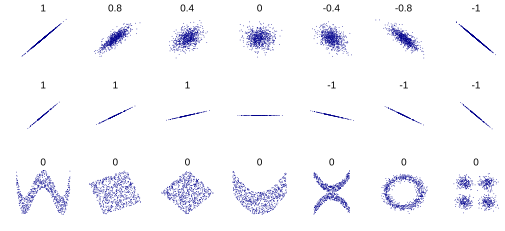

In [24]:
from IPython.display import SVG
SVG(url='http://upload.wikimedia.org/wikipedia/commons/d/d4/Correlation_examples2.svg')

Now, let's repeat this comparison analysis for every possible combination of stocks in our technology stock ticker list

In [69]:
# We can simply call pairplot on our DataFrame for an automatic visual analysis of all the comparisons
sns.pairplot(data = tech_rets.dropna(), size = 2.5, aspect = 1.15,
             plot_kws=dict(s=40, color = 'darkblue', edgecolor="w", linewidth=1, alpha = .5))

fig = plt.gcf()
fig.tight_layout(h_pad = 1, w_pad = 1)
plotly.offline.iplot_mpl(fig)

In [26]:
tech_rets.scatter_matrix(bins = 30, color = 'blue', size = 4)

In [27]:
# the same scatter plot using plotly instead of cufflinks
fig = ff.create_scatterplotmatrix(tech_rets, diag='histogram', size = 4,
                                  height=800, width=950, 
                                  title = "Tech Stocks Scatter Matrix")

plotly.offline.iplot(fig)

Above we can see all the relationships on daily returns between all the stocks. A quick glance shows an interesting correlation between Google and Amazon daily returns. It might be interesting to investigate that individual comaprison. While the simplicity of just calling sns.pairplot() is fantastic we can also use sns.PairGrid() for full control of the figure, including what kind of plots go in the diagonal, the upper triangle, and the lower triangle. Below is an example of utilizing the full power of seaborn to achieve this result.

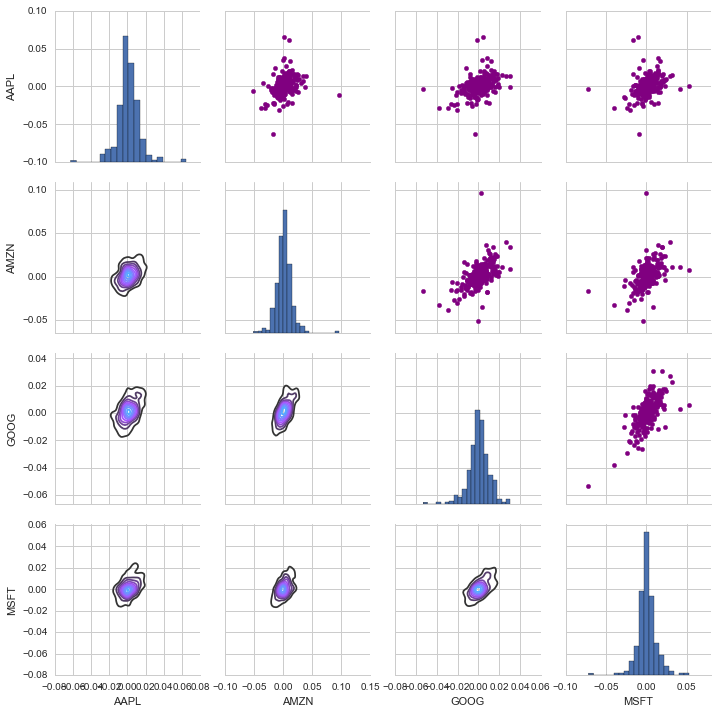

In [28]:
# Set up our figure by naming it returns_fig, call PairPLot on the DataFrame
returns_fig = sns.PairGrid(tech_rets.dropna())

# Using map_upper we can specify what the upper triangle will look like.
returns_fig.map_upper(plt.scatter,color='purple')

# We can also define the lower triangle in the figure, inclufing the plot type (kde) or the color map (BluePurple)
returns_fig.map_lower(sns.kdeplot,cmap='cool_d')

# Finally we'll define the diagonal as a series of histogram plots of the daily return
returns_fig.map_diag(plt.hist,bins=20)

We could have also analyzed the correlation of the closing prices using this exact same technique. Here it is shown, the code repeated from above with the exception of the DataFrame called.

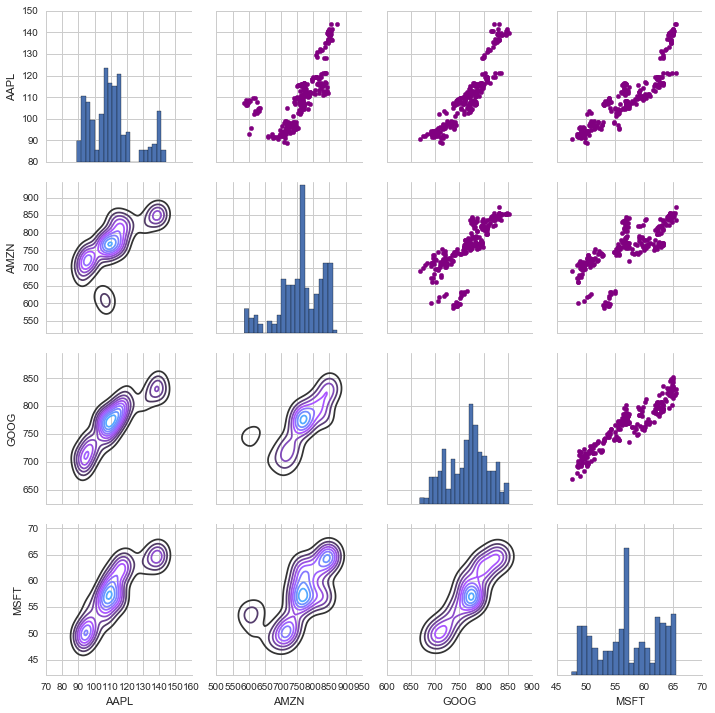

In [29]:
# Set up our figure by naming it returns_fig, call PairPLot on the DataFrame
returns_fig = sns.PairGrid(closing_df)

# Using map_upper we can specify what the upper triangle will look like.
returns_fig.map_upper(plt.scatter,color='purple')

# We can also define the lower triangle in the figure, inclufing the plot type (kde) or the color map (BluePurple)
returns_fig.map_lower(sns.kdeplot,cmap='cool_d')

# Finally we'll define the diagonal as a series of histogram plots of the closing price
returns_fig.map_diag(plt.hist,bins=20)

Finally, we could also do a correlation plot, to get actual numerical values for the correlation between the stocks' daily return values. By comparing the closing prices, we see an interesting relationship between Microsoft and Apple.

In [60]:
# the correlation Heatmap in plotly needs 3 arrays:
#   z: 2d numpy array (the correlation matrix)
#   x: names of vars on x-axis
#   y: names of vars on y-axis
z = tech_rets.dropna().corr().as_matrix()
x = tech_rets.dropna().corr().index.values
y = tech_rets.dropna().corr().index.values

In [61]:
# Convert data and labels array to match Seaborn
def make_seaborn(x_old, y_old,  z_old):
    x_sns = x_old[0:-1]      # remove last entry in x-corrd array
    y_sns = y_old[-1:0:-1]   # remove first entry, reverse order in y-coord array
    m,n = z_old.shape        # get dimension of original array
    tmp = np.empty((m,n))    # init. tmp array
    tmp.fill(np.nan)         #   with NaNs
    for i in range(m):             # loop through rows
        tmp[i,0:i] = z_old[i,0:i]  # add items below the diagonal
    tmp = np.flipud(tmp)     #  reverse order of all columns in tmp array
    z_sns = tmp  # copy tmp array to outpur variable
    return (x_sns,y_sns,z_sns)  # return new coodinates in tuple


In [62]:
x, y, z = make_seaborn(x, y, z)

In [65]:
fig = go.Figure()
fig['data'].append(go.Heatmap(z = z,
                              x = x,
                              y = y,
                              colorscale='YIGnBu',
                              reversescale = True))
fig['layout'].update(title = "Correlation Heatmap", width = 600, height = 450)

plotly.offline.iplot(fig)

In [68]:
# doing it with cufflinks (one line)
tech_rets.dropna().corr().iplot(kind = 'heatmap', colorscale = 'spectral')

Fantastic! Just like we suspected in our PairPlot we see here numerically and visually that Microsoft and Google had the strongest correlation of daily stock return. It's also interesting to see that all the technology comapnies are positively correlated.

Great! Now that we've done some daily return analysis, let's go ahead and start looking deeper into actual risk analysis.

# Risk Analysis

There are many ways we can quantify risk, one of the most basic ways using the information we've gathered on daily percentage returns is by comparing the expected return with the standard deviation of the daily returns.

In [34]:
# Let's start by defining a new DataFrame as a clenaed version of the oriignal tech_rets DataFrame
rets = tech_rets.dropna()

area = np.pi*20

plt.scatter(rets.mean(), rets.std(),alpha = 0.5,s =area)

# Set the x and y limits of the plot (optional, remove this if you don't see anything in your plot)
#plt.ylim([0.01,0.025])
#plt.xlim([-0.003,0.004])

#Set the plot axis titles
plt.xlabel('Expected returns')
plt.ylabel('Risk')

# Label the scatter plots, for more info on how this is done, chekc out the link below
# http://matplotlib.org/users/annotations_guide.html
for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (50, 50),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        arrowprops = dict(arrowstyle = '-', connectionstyle = 'arc3,rad=-0.3'))
    

fig = plt.gcf()

plotly.offline.iplot_mpl(fig, resize=True)